# Introduction
For my final capstone, I will create a model that processes a piece of an xray of breast tissue and classifies whether or not image contains cancerous tissue. Breast cancer is the most common form of cancer in women, contributing just over a quarter of diagnoses, so having the ability to improve the timeline and accuracy of a diagnosis would greatly improve the disease.

My solution will be valuable because it will capture this information more quickly and accurately than a person could. It would be a model used by hospitals and other healthcare organizations to identify the presence of cancerous tissue. This model would be able to see abnormalities at a much earlier stage which would allow treatment to commence earlier and have a higher success rate.  Ideally, the model could be adjusted for other types of tumor or disease classifications.

I will use the [Breast Histopathology Images dataset](https://www.kaggle.com/paultimothymooney/breast-histopathology-images) from the National Library of Medicine. There are 277,524 pieces of 162 images scanned which should be plenty of data to learn from. The data is imbalanced - there is a 34/66 split between the classes. To handle this, I will likely choose a random subset of the images marked IDC negative to ensure I have a balanced dataset.

Because the data is images, I don't believe it doesn't to be cleaned and prepped - it will simply be imported into Python and converted into a dataframe in which each column represents a pixel. I will then use dimensionality reduction and unsupervised learning to obtain in-depth knowledge about the information the data provides and visualize any patterns or clusters the information may fall into. I will need to do some research on how to use supervised learning on image processing/classification as it is not yet clear to me how to do so. Finally, I will use neural networks, and CNN in particular, to classify the scans and create a model that can take an un-labeled scan and report whether or not cancerous tissue is present. 

I anticipate importing and processing the images as well as tuning the parameters in the neural networks to be the biggest challenges I'll face. I plan on spending the majority of my time on these two items. For the most part, I should be able to recycle code from previous projects which should expedite my prepping and modeling. I'll do additional research on how best to use neural networks for image classification in an effort to obtain the best model.


In [3]:
import os
os.chdir('C:\\Users\\M246047\\Documents\\Python')
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
from datetime import datetime, timedelta
import re


# Importing/showing the files
from zipfile import ZipFile
import cv2
from glob import glob
from random import sample
import skimage.io as io

# Preprocessing/Cleaning Libraries
import xgboost
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
import scipy.stats as stats

# Import various componenets for model building
import tensorflow as tf
import keras
from keras import regularizers
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.layers import LSTM, Input, TimeDistributed
from keras.models import Model
from keras.optimizers import RMSprop
from keras.callbacks import History

# Dimensionality Reduction & Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.manifold import LocallyLinearEmbedding, TSNE
import umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
import hdbscan
from sklearn import datasets, metrics
from sklearn.neural_network import BernoulliRBM
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage as lnkg
from sklearn.neural_network import MLPClassifier


# Import the backend
from keras import backend as K
from keras.layers import Activation, Dropout, Flatten, Dense, BatchNormalization
from keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from keras.callbacks import EarlyStopping, ModelCheckpoint
# Data Augmentation
import argparse



# Set random seed
np.random.seed(0)

Using TensorFlow backend.


# The Images

Below we see samples of cancerous and non-cancerous tissue. The images containing cancer generally appear to be darker and more densely packed, a distinction that a model may use to classify an image. 


Why are these printing two sets of each?

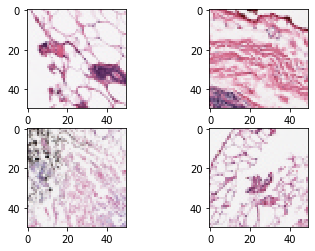

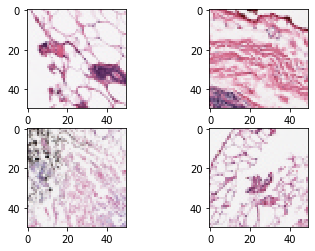

In [4]:
non_cancerous_images = io.imread_collection('88*_class0.png')
io.imshow_collection(non_cancerous_images)

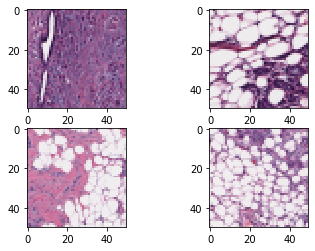

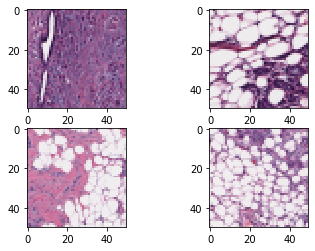

In [163]:
cancerous_images = io.imread_collection('88*_class1.png')
io.imshow_collection(cancerous_images)

# Importing and Prepping the Data

I gravely underestimated how difficult this task would be. I had an initial folder for the data which contained folders for each patient. Each of these folders contained two folders labeled 0 and 1 which contained images with or without cancerous tissue, depending on the folder. At first, I tried to iterate through each patient folder to grab the 0 and 1 folders within, and iterate through each of those folder to grab each image to import it, but was unable to do so. In the end I mapped to the initial folder and iterated through each patient folder to create arrays containing the pixel data for each image. Using the length of these arrays, I was able to create an array with the target values, with 0 for a scan without cancerous tissue and 1 for a scan with.

The data had a various number of scans from 227? patients for a total of 227,000? scans. The data was very imbalanced in favor of tissue without cancer - in order to combat this, once the scans were imported, I took an equal number samples of the scans without signs of cancer as scans with cancer to have an even split. 



In [6]:
list_of_dicts = []
for patient in glob('C:\\Users\\M246047\\Documents\\Python\\breast-histopathology-images\\*'):
    no_cancer = len([x for x in glob(patient + '\\0\\*')])
    cancer = len([x for x in glob(patient + '\\1\\*')])
    list_of_dicts.append({'patient': patient, 'cancer': cancer, 'no_cancer': no_cancer})
df = pd.DataFrame.from_dict(list_of_dicts)

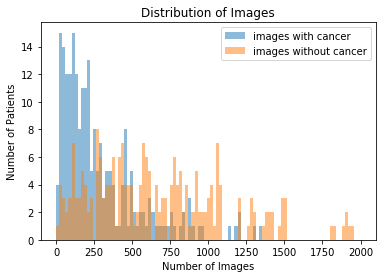

In [3]:
images_with = df['cancer']
images_without = df['no_cancer']
bins = np.linspace(0, 2000, 100)
plt.hist(images_with, bins, alpha=0.5, label='images with cancer')
plt.hist(images_without, bins, alpha=0.5, label='images without cancer')
plt.legend(loc='upper right')
plt.title('Distribution of Images')
plt.xlabel('Number of Images')
plt.ylabel('Number of Patients')
plt.show()


# Individual Patients - Importing the Images by Folder

Because there was so much data, I chose to focus on three patients, using a fourth as the validation set, when first creating my models so as to expedite the process. 

In [7]:
images_0_8863 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8863\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8863\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            images_0_8863.append(image_data)
            
images_0_8863 = np.asarray(images_0_8863)    
print('There are {} images'.format(len(images_0_8863)))
print('The type of the data is', type(images_0_8863))
print('The shape of the data is', images_0_8863.shape)
images_0_8863_class = np.zeros((len(images_0_8863),), dtype=int)

There are 768 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (768, 50, 50)


In [8]:
# Creating a list of image names
images_1_8863 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8863\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8863\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8863.append(image_data)
            
images_1_8863 = np.asarray(images_1_8863)
print('There are {} images'.format(len(images_1_8863)))
print('The type of the data is', type(images_1_8863))
print('The shape of the data is', images_1_8863.shape)
images_1_8863_class = np.ones((len(images_1_8863),), dtype=int)

There are 207 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (207, 50, 50)


In [9]:
images_0_8864 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8864\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8864\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_0_8864.append(image_data)
            
images_0_8864 = np.asarray(images_0_8864)    
print('There are {} images'.format(len(images_0_8864)))
print('The type of the data is', type(images_0_8864))
print('The shape of the data is', images_0_8864.shape)
images_0_8864_class = np.zeros((len(images_0_8864)), dtype=int)

There are 730 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (730, 50, 50)


In [10]:
# Creating a list of image names
images_1_8864 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8864\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8864\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8864.append(image_data)
            
images_1_8864 = np.asarray(images_1_8864)
print('There are {} images'.format(len(images_1_8864)))
print('The type of the data is', type(images_1_8864))
print('The shape of the data is', images_1_8864.shape)
images_1_8864_class = np.ones((len(images_1_8864),), dtype=int)

There are 326 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (326, 50, 50)


In [11]:
images_0_8865 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8865\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8865\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_0_8865.append(image_data)
            
images_0_8865 = np.asarray(images_0_8865)    
print('There are {} images'.format(len(images_0_8865)))
print('The type of the data is', type(images_0_8865))
print('The shape of the data is', images_0_8865.shape)
images_0_8865_class = np.zeros((len(images_0_8865)), dtype=int)

There are 657 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (657, 50, 50)


In [12]:
# Creating a list of image names
images_1_8865 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8865\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8865\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8865.append(image_data)
            
images_1_8865 = np.asarray(images_1_8865)
print('There are {} images'.format(len(images_1_8865)))
print('The type of the data is', type(images_1_8865))
print('The shape of the data is', images_1_8865.shape)
images_1_8865_class = np.ones((len(images_1_8865),), dtype=int)

There are 55 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (55, 50, 50)


In [13]:
images_0_8867 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8867\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8867\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_0_8867.append(image_data)
            
images_0_8867 = np.asarray(images_0_8867)    
print('There are {} images'.format(len(images_0_8867)))
print('The type of the data is', type(images_0_8867))
print('The shape of the data is', images_0_8867.shape)
images_0_8867_class = np.zeros((len(images_0_8867)), dtype=int)

There are 1478 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (1478, 50, 50)


In [14]:
# Creating a list of image names
images_1_8867 = []
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\8867\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\8867\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(2500,)
            images_1_8867.append(image_data)
            
images_1_8867 = np.asarray(images_1_8867)
print('There are {} images'.format(len(images_1_8867)))
print('The type of the data is', type(images_1_8867))
print('The shape of the data is', images_1_8867.shape)
images_1_8867_class = np.ones((len(images_1_8867),), dtype=int)

There are 162 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (162, 50, 50)


## Defining Training & Testing Sets and Normalizing the Data

Here I combine the non-cancerous images and target arrays with the cancerous data for a complete dataset.

## One Patient

In [15]:
# Create x_train and y_train
x1_train = np.append(images_0_8863, images_1_8863, axis=0)
y1_train = np.append(images_0_8863_class, images_1_8863_class, axis=0)
print('x_train shape:',x1_train.shape)
print('y_train shape:',y1_train.shape)

# Create x_test and y_test
x1_test = np.append(images_0_8865, images_1_8865, axis=0)
y1_test = np.append(images_0_8865_class, images_1_8865_class, axis=0)

print('x1_test shape:', x1_test.shape)
print('y1_test shape: ', y1_test.shape)

x_train shape: (975, 50, 50)
y_train shape: (975,)
x1_test shape: (712, 50, 50)
y1_test shape:  (712,)


In [59]:
# Convert to float32 for type consistency
x1_train = x1_train.astype('float32')
x1_test = x1_test.astype('float32')

# Normalize values to 1 from 0 to 255 (256 values of pixels)
x1_train /= 255
x1_test /= 255
print('x1_train shape:', x1_train.shape)
print('x1_test shape:', x1_test.shape)
# Convert class vectors to binary class matrices
# So instead of one column with two values, create two binary columns
y1_train = keras.utils.to_categorical(y1_train, 2)
y1_test = keras.utils.to_categorical(y1_test, 2)

x1_train shape: (975, 50, 50)
x1_test shape: (712, 50, 50)


In [35]:
# Per Yunus: first of all keep your images as (1,50,50) not as (1,2500).
img_rows = 50
img_cols = 50
if K.image_data_format() == 'channels_first':
    x1_train = x1_train.reshape(x1_train.shape[0], 1, img_rows, img_cols)
    x1_test = x1_test.reshape(x1_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x1_train = x1_train.reshape(x1_train.shape[0], img_rows, img_cols, 1)
    x1_test = x1_test.reshape(x1_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

### CNN Model with Relu

This model is a decent start with a test accuracy of 0.923, though I'm not sure why the test loss is so large at 20.06.

In [36]:
# Building the Model
num_classes = 2
model_cnn_relu = Sequential()
# First convolutional layer, note the specification of shape
model_cnn_relu.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
model_cnn_relu.add(Conv2D(64, (4, 4), activation='relu', kernel_regularizer=regularizers.l1(0.75)))

model_cnn_relu.add(Dropout(0.5))
model_cnn_relu.add(Flatten())
model_cnn_relu.add(Dense(num_classes, activation='softmax'))


# model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2))
# model_cnn_relu.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# model_cnn_relu.add(Dropout(0.5))


model_cnn_relu.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_cnn_relu.fit(x1_train, y1_train,
          batch_size=200,
          epochs=10,
          verbose=1,
          validation_data=(x1_test, y1_test))
score = model_cnn_relu.evaluate(x1_test, y1_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 975 samples, validate on 712 samples
Epoch 1/10
975/975 [==============================] - 8s 8ms/step - loss: 705.9895 - accuracy: 0.6379 - val_loss: 605.5942 - val_accuracy: 0.9228
Epoch 2/10
975/975 [==============================] - 7s 8ms/step - loss: 546.7242 - accuracy: 0.7877 - val_loss: 458.0365 - val_accuracy: 0.9228
Epoch 3/10
975/975 [==============================] - 7s 8ms/step - loss: 406.7642 - accuracy: 0.7877 - val_loss: 330.2795 - val_accuracy: 0.9228
Epoch 4/10
975/975 [==============================] - 7s 8ms/step - loss: 287.0601 - accuracy: 0.7877 - val_loss: 223.1645 - val_accuracy: 0.9228
Epoch 5/10
975/975 [==============================] - 7s 8ms/step - loss: 188.2889 - accuracy: 0.7877 - val_loss: 137.7992 - val_accuracy: 0.9228
Epoch 6/10
975/975 [==============================] - 7s 8ms/step - loss: 111.8055 - accuracy: 0.7867 - val_loss: 75.3065 - val_accuracy: 0.9228
Epoch 7/10
975/975 [==============================] - 8s 8ms/step - loss: 58.29

## Two Patients

In [49]:
# Create x_train and y_train

x2_train = np.concatenate((images_0_8863, images_1_8863, images_0_8864, images_1_8864), axis=0)
y2_train = np.concatenate((images_0_8863_class, images_1_8863_class, images_0_8864_class, images_1_8864_class), axis=0)
print('x2_train shape:',x2_train.shape)
print('y2_train shape:',y2_train.shape)

# Create x_test and y_test
x2_test = np.append(images_0_8865, images_1_8865, axis=0)
y2_test = np.append(images_0_8865_class, images_1_8865_class, axis=0)

print('x2_test shape:', x2_test.shape)
print('y2_test shape: ', y2_test.shape)

(768, 50, 50)
(207, 50, 50)
(768,)
(207,)
(657, 50, 50)
(55, 50, 50)
(657,)
(55,)
x2_train shape: (2031, 50, 50)
y2_train shape: (2031,)
x2_test shape: (712, 50, 50)
y2_test shape:  (712,)


In [61]:
# Convert to float32 for type consistency
x2_train = x2_train.astype('float32')
x2_test = x2_test.astype('float32')

# Normalize values to 1 from 0 to 255 (256 values of pixels)
x2_train /= 255
x2_test /= 255

# Convert class vectors to binary class matrices
# So instead of one column with two values, create two binary columns
y2_train = keras.utils.to_categorical(y2_train, 2)
y2_test = keras.utils.to_categorical(y2_test, 2)

print(x2_train.shape)
print(y2_train.shape)
print(x2_test.shape)
print(y2_test.shape)

(2031, 50, 50, 1)
(2031, 2)
(712, 50, 50, 1)
(712, 2)


In [62]:
# Per Yunus: first of all keep your images as (1,50,50) not as (1,2500).
img_rows = 50
img_cols = 50
if K.image_data_format() == 'channels_first':
    x2_train = x2_train.reshape(x2_train.shape[0], 1, img_rows, img_cols)
    x2_test = x2_test.reshape(x2_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x2_train = x2_train.reshape(x2_train.shape[0], img_rows, img_cols, 1)
    x2_test = x2_test.reshape(x2_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

### CNN Model with Relu

Neither the test accuracy nor loss have changed, indicating this could be a good model for the data, or that the images are simply very similar.



In [66]:
# Building the Model
num_classes = 2
model_cnn_relu = Sequential()
# First convolutional layer, note the specification of shape
model_cnn_relu.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
model_cnn_relu.add(Conv2D(64, (4, 4), activation='relu', kernel_regularizer=regularizers.l1(0.75)))

model_cnn_relu.add(Dropout(0.5))
model_cnn_relu.add(Flatten())
model_cnn_relu.add(Dense(num_classes, activation='softmax'))


# model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2))
# model_cnn_relu.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# model_cnn_relu.add(Dropout(0.5))


model_cnn_relu.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_cnn_relu.fit(x2_train, y2_train,
          batch_size=200,
          epochs=10,
          verbose=1,
          validation_data=(x2_test, y2_test))
score = model_cnn_relu.evaluate(x2_test, y2_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 2031 samples, validate on 712 samples
Epoch 1/10
2031/2031 [==============================] - 15s 7ms/step - loss: 620.4244 - accuracy: 0.6637 - val_loss: 429.5169 - val_accuracy: 0.9228
Epoch 2/10
2031/2031 [==============================] - 15s 8ms/step - loss: 319.7446 - accuracy: 0.7725 - val_loss: 186.8349 - val_accuracy: 0.9228
Epoch 3/10
2031/2031 [==============================] - 15s 8ms/step - loss: 120.3364 - accuracy: 0.7701 - val_loss: 49.8627 - val_accuracy: 0.9228
Epoch 4/10
2031/2031 [==============================] - 15s 7ms/step - loss: 29.2452 - accuracy: 0.7617 - val_loss: 19.5548 - val_accuracy: 0.9228
Epoch 5/10
2031/2031 [==============================] - 15s 7ms/step - loss: 19.9335 - accuracy: 0.7376 - val_loss: 19.8273 - val_accuracy: 0.9228
Epoch 6/10
2031/2031 [==============================] - 15s 7ms/step - loss: 20.2097 - accuracy: 0.7376 - val_loss: 20.0834 - val_accuracy: 0.9228
Epoch 7/10
2031/2031 [==============================] - 15s 7ms/st

## Three Patients

In [16]:
# Create x_train and y_train

x3_train = np.concatenate((images_0_8863, images_1_8863, images_0_8864, images_1_8864, images_0_8865, images_1_8865), axis=0)
y3_train = np.concatenate((images_0_8863_class, images_1_8863_class, images_0_8864_class, images_1_8864_class, images_0_8865_class, images_1_8865_class), axis=0)
print('x3_train shape:',x3_train.shape)
print('y3_train shape:',y3_train.shape)

# Create x_test and y_test
x3_test = np.append(images_0_8867, images_1_8867, axis=0)
y3_test = np.append(images_0_8867_class, images_1_8867_class, axis=0)

print('x3_test shape:', x3_test.shape)
print('y3_test shape: ', y3_test.shape)

x3_train shape: (2743, 50, 50)
y3_train shape: (2743,)
x3_test shape: (1640, 50, 50)
y3_test shape:  (1640,)


In [17]:
# Convert to float32 for type consistency
x3_train = x3_train.astype('float32')
x3_test = x3_test.astype('float32')

# Normalize values to 1 from 0 to 255 (256 values of pixels)
x3_train /= 255
x3_test /= 255

# Convert class vectors to binary class matrices
# So instead of one column with two values, create two binary columns
y3_train = keras.utils.to_categorical(y3_train, 2)
y3_test = keras.utils.to_categorical(y3_test, 2)

print(x3_train.shape)
print(y3_train.shape)
print(x3_test.shape)
print(y3_test.shape)

(2743, 50, 50)
(2743, 2)
(1640, 50, 50)
(1640, 2)


In [18]:
# Per Yunus: first of all keep your images as (1,50,50) not as (1,2500).
img_rows = 50
img_cols = 50
if K.image_data_format() == 'channels_first':
    x3_train = x3_train.reshape(x3_train.shape[0], 1, img_rows, img_cols)
    x3_test = x3_test.reshape(x3_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x3_train = x3_train.reshape(x3_train.shape[0], img_rows, img_cols, 1)
    x3_test = x3_test.reshape(x3_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

### CNN Model with Relu

The test metrics have slightly decreased in performance to a loss of 21.44 and accuracy of 0.90. 

In [147]:
# Building the Model
num_classes = 2
patients_3 = Sequential()
# First convolutional layer, note the specification of shape
patients_3.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
patients_3.add(Conv2D(64, (4, 4), activation='relu', kernel_regularizer=regularizers.l1(0.75)))

patients_3.add(Dropout(0.5))
patients_3.add(Flatten())
patients_3.add(Dense(num_classes, activation='softmax'))


# model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2))
# model_cnn_relu.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# model_cnn_relu.add(Dropout(0.5))


patients_3.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

patients_3.fit(x3_train, y3_train,
          batch_size=200,
          epochs=5,
          verbose=1,
          validation_data=(x3_test, y3_test))
score = patients_3.evaluate(x3_test, y3_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 2743 samples, validate on 1640 samples
Epoch 1/5
2743/2743 [==============================] - 25s 9ms/step - loss: 567.8677 - accuracy: 0.7339 - val_loss: 352.8241 - val_accuracy: 0.9012
Epoch 2/5
2743/2743 [==============================] - 25s 9ms/step - loss: 223.0183 - accuracy: 0.7510 - val_loss: 98.4054 - val_accuracy: 0.9030
Epoch 3/5
2743/2743 [==============================] - 24s 9ms/step - loss: 47.8620 - accuracy: 0.8035 - val_loss: 19.8688 - val_accuracy: 0.9012
Epoch 4/5
2743/2743 [==============================] - 24s 9ms/step - loss: 19.9202 - accuracy: 0.7463 - val_loss: 19.8880 - val_accuracy: 0.9012
Epoch 5/5
2743/2743 [==============================] - 24s 9ms/step - loss: 20.1104 - accuracy: 0.7856 - val_loss: 20.2902 - val_accuracy: 0.9012
Test loss: 20.290162351654796
Test accuracy: 0.9012194871902466


### Plotting the Loss and Accuracy


In [25]:
print(patients_3.history.history['val_accuracy'])
print((patients_3.history.history['accuracy']))

[0.9012194871902466, 0.9012194871902466, 0.09878049045801163, 0.9012194871902466, 0.9012194871902466]
[0.72110826, 0.79584396, 0.8034998, 0.70761937, 0.7856362]


dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


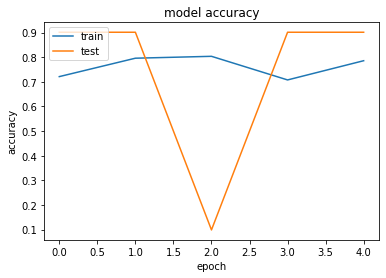

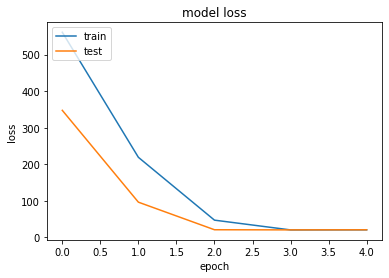

In [24]:
print(patients_3.history.history.keys())
# summarize history for accuracy
plt.plot(patients_3.history.history['accuracy'])
plt.plot(patients_3.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(patients_3.history.history['loss'])
plt.plot(patients_3.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### Confusion Matrix

While the accuracy for these models has been high at around 0.9, it's clear from the confusion matrix below that the model has simply been assigning each image to zero, or no cancer. Because the data was so imbalanced, according to the loss and accuracy this is a good model, but it's realistically terrible.

In [148]:
patients_3_predictions = patients_3.predict(x_test)
y_pred = (patients_3_predictions > 0.5)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
matrix

array([[11695,     0],
       [11695,     0]], dtype=int64)

# Questions
- raw images (one with cancer, one without)
- same images before they're fed into the neural network
- plot type 1 and 2 errors - how would this help without a feature to plot against?
- plot errors - how would I do this, what would it help?
- how to use feature importance in keras?
- how is XGBoost getting a training score of 1 and testing score of 0.5? Significantly overfitting, and then just choosing a label?

# All the Data

The previous models were utterly useless. Hopefully importing much more data and sampling the images without cancer to be equal in number to the images with cancer to combat the imbalance will provide a better outcome.

## Creating the Training and Testing Data

In [4]:
X_1 = [] # training data labeled 1
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\1'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\1\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_1.append(image_data)
            
X_1 = np.asarray(X_1)    
print('There are {} images'.format(len(X_1)))
print('The type of the data is', type(X_1))
print('The shape of the data is', X_1.shape)
X_1_target = np.ones((len(X_1),), dtype=int)
X_0_target = np.ones((len(X_1),), dtype=int)


There are 27671 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (27671, 50, 50)


In [6]:
X_0 = [] # training data labeled 0
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\0'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\0\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_0.append(image_data)
            
X_0 = np.asarray(X_0)
print('There are {} images'.format(len(X_0)))
print('The type of the data is', type(X_0))
print('The shape of the data is', X_0.shape)
X_0 = X_0[:(len(X_1)),:,:]
print('There are {} images of non-cancerous tissue once sampled'.format(len(X_0)))

There are 79600 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (79600, 50, 50)
There are 27671 images of non-cancerous tissue once sampled


In [7]:
X_1_test = [] # testing data labeled 1
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\1_test'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\1_test\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_1_test.append(image_data)
            
X_1_test = np.asarray(X_1_test)    
print('There are {} images'.format(len(X_1_test)))
print('The type of the data is', type(X_1_test))
print('The shape of the data is', X_1_test.shape)
X_1_test_target = np.ones((len(X_1_test),), dtype=int)
X_0_test_target = np.zeros((len(X_1_test),), dtype=int)

There are 11695 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (11695, 50, 50)


In [8]:
X_0_test = [] # testing data labeled 0
for root, dirs, files in os.walk('C:\\Users\\M246047\\Documents\\Python\\0_test'):
    for filename in files:
        image_data = cv2.imread('C:\\Users\\M246047\\Documents\\Python\\0_test\\'+filename, 0)
#         print(filename)
#         print(image_data.shape)
        if image_data.shape==(50,50):
#             image_data = image_data.reshape(1, 50, 50)
            X_0_test.append(image_data)
            
X_0_test = np.asarray(X_0_test)    
print('There are {} images'.format(len(X_0_test)))
print('The type of the data is', type(X_0_test))
print('The shape of the data is', X_0_test.shape)
X_0_test = X_0_test[:(len(X_1_test)),:,:]
print('There are {} images of non-cancerous tissue once sampled'.format(len(X_0_test)))

There are 23173 images
The type of the data is <class 'numpy.ndarray'>
The shape of the data is (23173, 50, 50)
There are 11695 images of non-cancerous tissue once sampled


# Visualizing the Data with Dimensionality Reduction

## PCA

While t-SNE and UMAP are more modern techniques that typically work well with images, they not only do not provide information, but they are taking a remarkably long time to run on my machine and often crashing the kernel. PCA doesn't offer too much insight, but I can see that slides with cancerous tissue are clustering on the left side of the image.

In [7]:
X = np.concatenate((X_0, X_1, X_0_test, X_1_test), axis=0)
y = np.concatenate((X_0_target, X_1_target, X_0_test_target, X_1_test_target), axis=0)
X = X.reshape(78732,2500)
X = pd.DataFrame(X)
X = X/255
X['y'] = y
print(X.shape, y.shape)

# Because the data is so large, we may need to use a random sample for some techniques
X_sample = X.sample(frac=0.25, random_state=1)

(78732, 2501) (78732,)


In [8]:
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

# Plotting the visualization
plt.figure(figsize=(10,5))
colours = ["r","b"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
# plt.axis('off')
plt.show()

## UMAP

UMAP Visualization. 



C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


UMAP for X with  100 neighbors and  0.1 minimum distance.


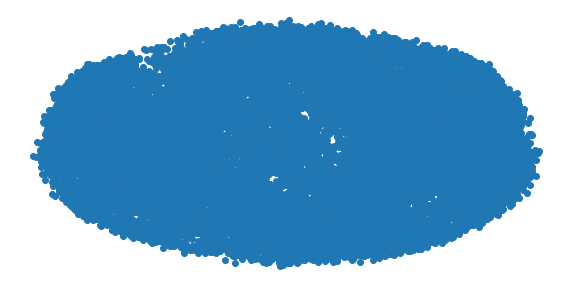

C:\ProgramData\Anaconda3\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\ProgramData\Anaconda3\lib\site-packages\umap\nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


In [ ]:
# UMAP with all features
print('UMAP Visualization. \n')
for n_neighbors in [100, 500]:
    for min_dist in [0.1, 0.25]:
        umap_results = umap.UMAP(n_neighbors=n_neighbors,
                      min_dist=min_dist,
                      metric='correlation').fit_transform(X_sample)
        print('UMAP for X with ', n_neighbors, 'neighbors and ', min_dist, 'minimum distance.')
        plt.figure(figsize=(10,5))
        plt.scatter(umap_results[:, 0], umap_results[:, 1])
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()
        print('\n')

## Defining Training & Testing Sets and Normalizing the Data

In [9]:
# Create x_train and y_train
x_train = np.append(X_1, X_0, axis=0)
y_train = np.append(X_1_target, X_0_target, axis=0)
print('x_train shape:',x_train.shape)
print('y_train shape:',y_train.shape)

# Create x_test and y_test
x_test = np.append(X_1_test, X_0_test, axis=0)
y_test = np.append(X_1_test_target, X_0_test_target, axis=0)

print('x_test shape:', x_test.shape)
print('y_test shape: ', y_test.shape)

x_train shape: (55342, 50, 50)
y_train shape: (55342,)
x_test shape: (23390, 50, 50)
y_test shape:  (23390,)


In [10]:
# Convert to float32 for type consistency
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# Normalize values to 1 from 0 to 255 (256 values of pixels)
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print('x_test shape:', x_test.shape)
print('y_train shape:', y_train.shape)
print('y_test shape:', y_test.shape)
# Convert class vectors to binary class matrices
# So instead of one column with 10 values, create 10 binary columns
y_train = keras.utils.to_categorical(y_train, 2)
y_test = keras.utils.to_categorical(y_test, 2)

x_train shape: (55342, 50, 50)
x_test shape: (23390, 50, 50)
y_train shape: (55342,)
y_test shape: (23390,)


In [11]:
# Per Yunus: first of all keep your images as (1,50,50) not as (1,2500).
img_rows = 50
img_cols = 50
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

# Using XGBoost as a Starting Point

I'm using XGBoost as a starting point to see how the metrics can improve over the course of testing. This model is clearly overfitting as much as possible, with a score of 1 for the training sets and 0.5 for the testing set. The model hasn't learned anything - it simply chooses one of the labels and assigns that to each image. This is the worst possible scenario, and I hope to improve it using Neural Networks.

In [12]:
x_train_xgb = x_train.reshape(55342, 2500)
x_test_xgb = x_test.reshape(23390, 2500)
y_train_xgb = np.append(X_1_target, X_0_target, axis=0)
y_test_xgb = np.append(X_1_test_target, X_0_test_target, axis=0)
print(x_train_xgb.shape)
print(y_train_xgb.shape)

(55342, 2500)
(55342,)


In [15]:
# defining the model
xgb_clf = xgboost.XGBClassifier()
xgb_clf = xgb_clf.fit(x_train_xgb, y_train_xgb)

print('Training score:', xgb_clf.score(x_train_xgb, y_train_xgb))
print('Testing score:', xgb_clf.score(x_test_xgb, y_test_xgb))

Training score: 1.0
Testing score: 0.5


In [21]:
xgb_clf_predictions = xgb_clf.predict(x_test_xgb)
y_pred = (xgb_clf_predictions > 0.5)
matrix = metrics.confusion_matrix(y_test_xgb, xgb_clf_predictions)
matrix

array([[    0, 11695],
       [    0, 11695]], dtype=int64)

# Creating the Neural Networks

## Model 1: Simple Sequential

This model grossly overfits the data. 

In [71]:
# Start with a simple sequential model
model_seq = Sequential()
model_seq.add(Flatten())
# Add dense layers to create a fully connected MLP
# Note that we specify an input shape for the first layer, but only the first layer.
# Relu is the activation function used
model_seq.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# Dropout layers remove features and fight overfitting
model_seq.add(Dropout(0.5))
model_seq.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
model_seq.add(Dropout(0.5))
# End with a number of units equal to the number of classes we have for our outcome
model_seq.add(Dense(2, activation='softmax', kernel_regularizer=regularizers.l1(0.75)))



# Compile the model to put it all together.
model_seq.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history = model_seq.fit(x_train, y_train,
                    batch_size=500,
                    epochs=10,
                    verbose=1,
                    validation_data=(x_test, y_test))
score = model_seq.evaluate(x_test, y_test, verbose=0)
model_seq.summary()
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Train on 55342 samples, validate on 23390 samples
Epoch 1/10
55342/55342 [==============================] - 2s 28us/step - loss: 516.1746 - accuracy: 0.8248 - val_loss: 132.1763 - val_accuracy: 0.5000
Epoch 2/10
55342/55342 [==============================] - 1s 26us/step - loss: 83.2010 - accuracy: 1.0000 - val_loss: 62.7764 - val_accuracy: 0.5000
Epoch 3/10
55342/55342 [==============================] - 1s 25us/step - loss: 62.0000 - accuracy: 1.0000 - val_loss: 62.1110 - val_accuracy: 0.5000
Epoch 4/10
55342/55342 [==============================] - 1s 25us/step - loss: 61.8055 - accuracy: 1.0000 - val_loss: 62.2232 - val_accuracy: 0.5000
Epoch 5/10
55342/55342 [==============================] - 1s 25us/step - loss: 61.7437 - accuracy: 1.0000 - val_loss: 62.2420 - val_accuracy: 0.5000
Epoch 6/10
55342/55342 [==============================] - 1s 26us/step - loss: 61.6899 - accuracy: 1.0000 - val_loss: 62.3128 - val_accuracy: 0.5000
Epoch 7/10
55342/55342 [==============================

## Model 2: Convolutional Neural Network with Relu Activation

In [13]:
# Building the Model
num_classes = 2
model_cnn_relu = Sequential()
# First convolutional layer, note the specification of shape
model_cnn_relu.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2)))                  
model_cnn_relu.add(Conv2D(64, (4, 4), activation='relu', kernel_regularizer=regularizers.l1(0.75)))
model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2)))
# model_cnn_relu.add(Dropout(0.5))
model_cnn_relu.add(Flatten())
model_cnn_relu.add(Dense(num_classes, activation='softmax'))


# model_cnn_relu.add(MaxPooling2D(pool_size=(2, 2))
# model_cnn_relu.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.75)))
# model_cnn_relu.add(Dropout(0.5))


model_cnn_relu.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_cnn_relu.fit(x_train, y_train,
          batch_size=200,
          epochs=5,
          verbose=1,
          validation_data=(x_test, y_test))

model_cnn_relu_predictions = model_cnn_relu.predict_classes(x_test)
model_cnn_relu_score = model_cnn_relu.evaluate(x_test, y_test, verbose=0)
print('Test loss:', model_cnn_relu_score[0])
print('Test accuracy:', model_cnn_relu_score[1])

Train on 55342 samples, validate on 23390 samples
Epoch 1/5
55342/55342 [==============================] - 129s 2ms/step - loss: 59.9124 - accuracy: 1.0000 - val_loss: 28.9715 - val_accuracy: 0.5000
Epoch 2/5
55342/55342 [==============================] - 133s 2ms/step - loss: 25.5265 - accuracy: 1.0000 - val_loss: 33.7280 - val_accuracy: 0.5000
Epoch 3/5
55342/55342 [==============================] - 189s 3ms/step - loss: 29.3444 - accuracy: 1.0000 - val_loss: 37.5214 - val_accuracy: 0.5000
Epoch 4/5
55342/55342 [==============================] - 199s 4ms/step - loss: 32.7172 - accuracy: 1.0000 - val_loss: 40.9268 - val_accuracy: 0.5000
Epoch 5/5
55342/55342 [==============================] - 186s 3ms/step - loss: 35.7730 - accuracy: 1.0000 - val_loss: 43.9504 - val_accuracy: 0.5000
Test loss: 43.95040222109256
Test accuracy: 0.5


### Plotting the Loss and Accuracy

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


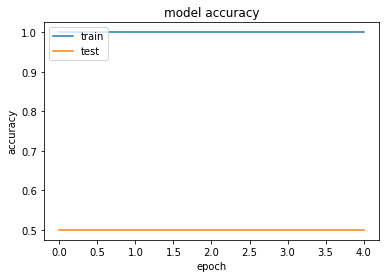

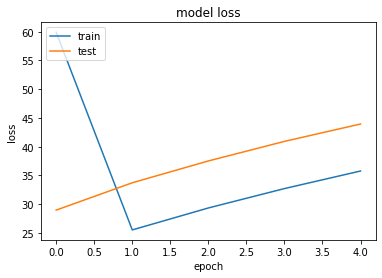

In [14]:
# list all data in history
print(model_cnn_relu.history.history.keys())
# summarize history for accuracy
plt.plot(model_cnn_relu.history.history['accuracy'])
plt.plot(model_cnn_relu.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_cnn_relu.history.history['loss'])
plt.plot(model_cnn_relu.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [146]:
model_cnn_relu_predictions = model_cnn_relu.predict(x_test)
y_pred = (model_cnn_relu_predictions > 0.5)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
matrix

array([[    0, 11695],
       [    0, 11695]], dtype=int64)

## Model 3: CNN With TanH Activation


In [79]:
# Building the Model
num_classes = 2
model_cnn_tanh = Sequential()
# First convolutional layer, note the specification of shape
model_cnn_tanh.add(Conv2D(32, kernel_size=(4, 4),
                 activation='tanh',
                 input_shape=input_shape,  kernel_regularizer=regularizers.l2(0.75)))
model_cnn_tanh.add(Conv2D(64, (4, 4), activation='tanh',  kernel_regularizer=regularizers.l2(0.75)))
model_cnn_tanh.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn_tanh.add(Dropout(0.25))
model_cnn_tanh.add(Flatten())
model_cnn_tanh.add(Dense(50, activation='tanh',  kernel_regularizer=regularizers.l2(0.75)))
model_cnn_tanh.add(Dropout(0.5))
model_cnn_tanh.add(Dense(num_classes, activation='softmax',  kernel_regularizer=regularizers.l2(0.75)))

model_cnn_tanh.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_cnn_tanh.fit(x_train, y_train,
          batch_size=128,
          epochs=5,
          verbose=1,
          validation_data=(x_test, y_test))
score = model_cnn_tanh.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 55342 samples, validate on 23390 samples
Epoch 1/5
55342/55342 [==============================] - 382s 7ms/step - loss: 2.7862 - accuracy: 0.9993 - val_loss: 1.9408 - val_accuracy: 0.5000
Epoch 2/5
55342/55342 [==============================] - 360s 7ms/step - loss: 0.1937 - accuracy: 1.0000 - val_loss: 1.3733 - val_accuracy: 0.5000
Epoch 3/5
55342/55342 [==============================] - 366s 7ms/step - loss: 0.0667 - accuracy: 1.0000 - val_loss: 1.8607 - val_accuracy: 0.5000
Epoch 4/5
55342/55342 [==============================] - 358s 6ms/step - loss: 0.0253 - accuracy: 1.0000 - val_loss: 2.1691 - val_accuracy: 0.5000
Epoch 5/5
55342/55342 [==============================] - 378s 7ms/step - loss: 0.0105 - accuracy: 1.0000 - val_loss: 2.5689 - val_accuracy: 0.5000
Test loss: 2.5689135159116976
Test accuracy: 0.5


### Plotting the Loss and Accuracy

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


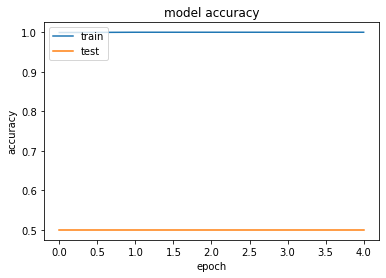

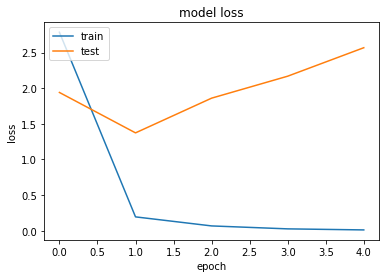

In [80]:
# list all data in history
print(model_cnn_tanh.history.history.keys())
# summarize history for accuracy
plt.plot(model_cnn_tanh.history.history['accuracy'])
plt.plot(model_cnn_tanh.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_cnn_tanh.history.history['loss'])
plt.plot(model_cnn_tanh.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Model 4:Hierarchical Recurrent Neural Networks


In [98]:
# Training parameters.
batch_size = 64
num_classes = 2
epochs = 3

# Embedding dimensions.
row_hidden = 32
col_hidden = 32


row, col, pixel = x_train.shape[1:]

# 4D input.
x = Input(shape=(row, col, pixel))

# Encodes a row of pixels using TimeDistributed Wrapper.
encoded_rows = TimeDistributed(LSTM(row_hidden))(x)

# Encodes columns of encoded rows.
encoded_columns = LSTM(col_hidden)(encoded_rows)

# Final predictions and model.
prediction = Dense(num_classes, activation='softmax')(encoded_columns)
model_hrnn = Model(x, prediction)
model_hrnn.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# Training.
model_hrnn.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))

# Evaluation.
scores = model_hrnn.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Train on 55342 samples, validate on 23390 samples
Epoch 1/3
55342/55342 [==============================] - 527s 10ms/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 9.4285 - val_accuracy: 0.5000
Epoch 2/3
55342/55342 [==============================] - 532s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 9.8968 - val_accuracy: 0.5000
Epoch 3/3
55342/55342 [==============================] - 536s 10ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 10.1381 - val_accuracy: 0.5000
Test loss: 10.138056203410788
Test accuracy: 0.5


### Plotting Accuracy and Loss

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


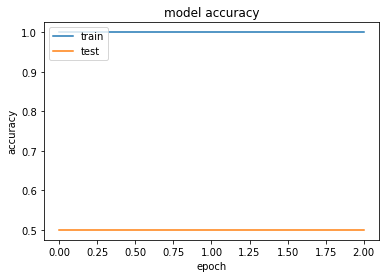

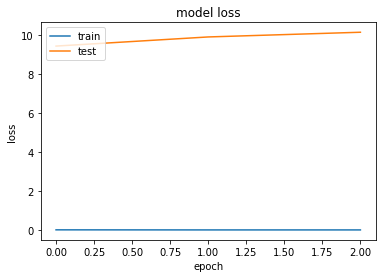

In [99]:
# list all data in history
print(model_hrnn.history.history.keys())
# summarize history for accuracy
plt.plot(model_hrnn.history.history['accuracy'])
plt.plot(model_hrnn.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_hrnn.history.history['loss'])
plt.plot(model_hrnn.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Data Augmentation

So far, all of our models have been overfitting. They've been unable to differentiate different tissue to identify whether an image contains traces of cancer. Data augmentation will allow me to slightly modify the images in a last-ditch effort to train a model that can classify images and diagnose breast cancer.

In [18]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rotation_range=45,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   validation_split = .2)
test_datagen = ImageDataGenerator(rescale=1./255,
                                  validation_split = .2)

In [19]:
training_set = train_datagen.flow_from_directory('C:\\Users\\M246047\\Documents\\Python\\breast_tissue_train',
                                       target_size=(50, 50),
                                                batch_size=32,
                                     class_mode='categorical',
                                            subset='training',
                                            color_mode='grayscale')

validation_set = test_datagen.flow_from_directory('C:\\Users\\M246047\\Documents\\Python\\breast_tissue_test',
                                        target_size=(50, 50),
                                                 batch_size=32,
                                      class_mode='categorical',
                                               shuffle = False,
                                           subset='validation',
                                             color_mode='grayscale')

Found 86287 images belonging to 2 classes.
Found 16902 images belonging to 2 classes.


### Models 6: CNN with TanH Activation

This is the first model to assign two different classes. It's pretty decent at correctly classifying images without cancerous tissue with a success rate of 87.5%, but labels cancerous tissue correctly less than two-thirds of the time. I spent quite a bit of time tuning this model using different batch sizes, dropout rates, kernel sizes, optimizers, and learning rates, and below is the best model using TanH as activation that was produced.

While I used 30 epochs the last time I ran it, you can see that this is unecessary - the model performs best fairly early in the process. It starts out reasonably high with a validation accuracy just under 70% and increases to 75% at it's prime. 

In [20]:
# Building the Model
num_classes = 2
model_6 = Sequential()
# First convolutional layer, note the specification of shape
model_6.add(Conv2D(32, kernel_size=(3, 3),
                 activation='tanh',
                 input_shape=input_shape))
model_6.add(Conv2D(64, (4, 4), activation='tanh'))
model_6.add(MaxPooling2D(pool_size=(2, 2)))
# model_6.add(Dropout(0.5))
model_6.add(Flatten())
# model_6.add(Dense(50, activation='relu'))
model_6.add(Dropout(0.5))
model_6.add(Dense(num_classes, activation='softmax'))

model_6.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(learning_rate=0.01),
              metrics=['accuracy'])

model_6.fit_generator(training_set,
                    steps_per_epoch=len(training_set),
                    epochs=30,
                    validation_data=validation_set,
                    validation_steps=len(validation_set))

# Evaluation.
scores = model_6.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])



Epoch 1/30
2697/2697 [==============================] - 1081s 401ms/step - loss: 0.5154 - accuracy: 0.7493 - val_loss: 1.0836 - val_accuracy: 0.6997
Epoch 2/30
2697/2697 [==============================] - 703s 261ms/step - loss: 0.4818 - accuracy: 0.7706 - val_loss: 1.0386 - val_accuracy: 0.7280
Epoch 3/30
2697/2697 [==============================] - 689s 256ms/step - loss: 0.4772 - accuracy: 0.7725 - val_loss: 1.0626 - val_accuracy: 0.7321
Epoch 4/30
2697/2697 [==============================] - 644s 239ms/step - loss: 0.4750 - accuracy: 0.7724 - val_loss: 1.0264 - val_accuracy: 0.7458
Epoch 5/30
2697/2697 [==============================] - 655s 243ms/step - loss: 0.4740 - accuracy: 0.7737 - val_loss: 1.1298 - val_accuracy: 0.7238
Epoch 6/30
2697/2697 [==============================] - 656s 243ms/step - loss: 0.4731 - accuracy: 0.7740 - val_loss: 1.0267 - val_accuracy: 0.7507
Epoch 7/30
2697/2697 [==============================] - 705s 262ms/step - loss: 0.4719 - accuracy: 0.7742 - val

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


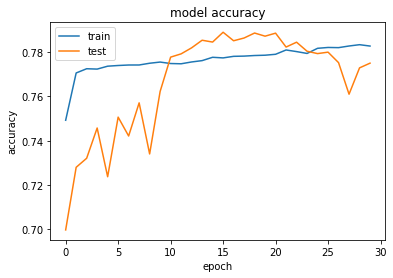

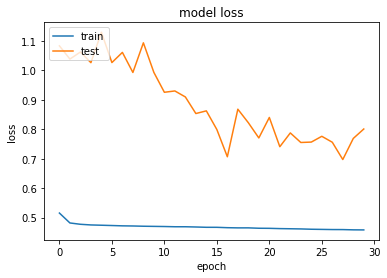

In [21]:
# list all data in history
print(model_6.history.history.keys())
# summarize history for accuracy
plt.plot(model_6.history.history['accuracy'])
plt.plot(model_6.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_6.history.history['loss'])
plt.plot(model_6.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [31]:
model_6_predictions = model_6.predict(x_test)
y_pred = (model_6_predictions > 0.5)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
matrix

array([[9323, 2372],
       [2894, 8801]], dtype=int64)

|| Class 1 Predicted | Class 2 Predicted   |
|------|------|------|
Actual Class 1| 9,323 | 2,372 |       
Actual Class 2 | 2,894 | 8,801 |   

|| Class 1 Predicted | Class 2 Predicted   |
|------|------|------|
Actual Class 1| 79.7% (True Negative)| 20.3% (False Negative) |
Actual Class 2 | 24.7% (False Positive) | 75.3% (True Positive)|



### Model 7: CNN with Relu Activation

The most significant difference between models 6 and 7 is the activation - the previous model used TanH where this model uses Relu. The parameters remain mostly unchanged and it performs slightly better, by two percentage points. While this may seem inconsequential, the reality is that any improvement is critical as it leads to fewer incorrect diagnoses. This model performs better, particularly in classifying class 2, which are the images of tissue containing cancer. The errors in this model are extremely imabalanced in that a false positive (incorrectly diagnosing someone with cancer) is much less egregious than a false negative (missing cancerous tissue in a patient). After much tampering and running this model many times, the parameters below provide the best solutions.

In [24]:
# Building the Model
num_classes = 2
model_7 = Sequential()
# First convolutional layer, note the specification of shape
model_7.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))

model_7.add(Conv2D(64, (4, 4), activation='relu'))
model_7.add(MaxPooling2D(pool_size=(2, 2)))

model_7.add(Flatten())
model_7.add(Dense(128, activation='relu'))

model_7.add(Dense(num_classes, activation='softmax'))

model_7.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_7.fit_generator(training_set,
                    steps_per_epoch=len(training_set),
                    epochs=25,
                    validation_data=validation_set,
                    validation_steps=len(validation_set))

# Evaluation.
scores = model_7.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Epoch 1/25
2697/2697 [==============================] - 893s 331ms/step - loss: 0.4902 - accuracy: 0.7719 - val_loss: 1.2873 - val_accuracy: 0.6892
Epoch 2/25
2697/2697 [==============================] - 889s 330ms/step - loss: 0.4666 - accuracy: 0.7857 - val_loss: 1.0653 - val_accuracy: 0.7442
Epoch 3/25
2697/2697 [==============================] - 842s 312ms/step - loss: 0.4484 - accuracy: 0.7978 - val_loss: 0.9687 - val_accuracy: 0.7943
Epoch 4/25
2697/2697 [==============================] - 1067s 396ms/step - loss: 0.4385 - accuracy: 0.8048 - val_loss: 1.2433 - val_accuracy: 0.8101
Epoch 5/25
2697/2697 [==============================] - 1046s 388ms/step - loss: 0.4296 - accuracy: 0.8108 - val_loss: 1.5466 - val_accuracy: 0.8068
Epoch 6/25
2697/2697 [==============================] - 793s 294ms/step - loss: 0.4224 - accuracy: 0.8155 - val_loss: 1.4006 - val_accuracy: 0.8064
Epoch 7/25
2697/2697 [==============================] - 787s 292ms/step - loss: 0.4189 - accuracy: 0.8159 - va

In [94]:
# Evaluation.
scores = model_7.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Test loss: 0.48022514636850905
Test accuracy: 0.7762719392776489


dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


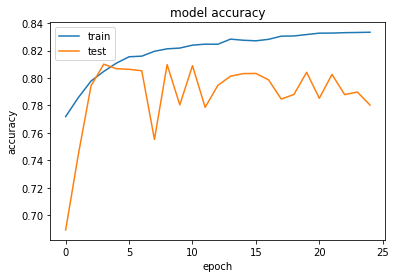

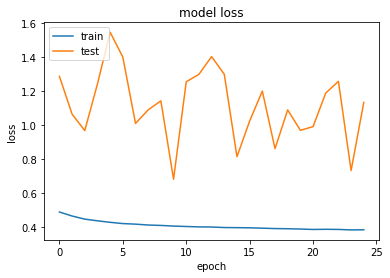

In [28]:
# list all data in history
print(model_7.history.history.keys())
# summarize history for accuracy
plt.plot(model_7.history.history['accuracy'])
plt.plot(model_7.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(model_7.history.history['loss'])
plt.plot(model_7.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [29]:
model_7_predictions = model_7.predict(x_test)
# y_pred = (model_7_predictions > 0.5)
matrix = metrics.confusion_matrix(y_test.argmax(axis=1), model_7_predictions.argmax(axis=1))
matrix

array([[9242, 2453],
       [2382, 9313]], dtype=int64)

|| Class 1 Predicted | Class 2 Predicted   |
|------|------|------|
Actual Class 1| 9,242 | 2,453 |      11,695 
Actual Class 2 | 2,382 | 9,313 |   

|| Class 1 Predicted | Class 2 Predicted   |
|------|------|------|
Actual Class 1| 79.0% (True Positive)| 20.9% (False Positive) |
Actual Class 2 | 20.3% (False Negative) | 79.6% (True Negative)|




# Model 7 with Callbacks

I attempted to use callbacks with this model, but was unfortunately unsuccessful. It was exactly the same with the exception of the callbacks but the model would stop running after three epochs as it did not improve.

In [27]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Building the Model
num_classes = 2
model_8 = Sequential()
# First convolutional layer, note the specification of shape
model_8.add(Conv2D(32, kernel_size=(4, 4),
                 activation='relu',
                 input_shape=input_shape))
model_8.add(Conv2D(64, (4, 4), activation='relu'))

model_8.add(Flatten())
model_8.add(Dense(128, activation='relu'))

model_8.add(Dense(num_classes, activation='softmax'))

model_8.compile(loss=keras.losses.binary_crossentropy,
              optimizer=keras.optimizers.Adadelta(learning_rate=0.001),
              metrics=['accuracy'])

# Set callback functions to early stop training and save the best model so far
callbacks = [EarlyStopping(monitor='val_accuracy', patience=2),
             ModelCheckpoint(filepath='best_model.h5', monitor='val_accuracy', save_best_only=True)]


history_8 = model_8.fit_generator(training_set,
                    steps_per_epoch=len(training_set),
                    epochs=20,
                    callbacks=callbacks,
                    validation_data=validation_set,
                    validation_steps=len(validation_set))

# Evaluation.
scores = model_8.evaluate(x_test, y_test, verbose=0)
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Epoch 1/20
2697/2697 [==============================] - 1721s 638ms/step - loss: 0.5367 - accuracy: 0.7431 - val_loss: 1.4911 - val_accuracy: 0.6660
Epoch 2/20
2697/2697 [==============================] - 1680s 623ms/step - loss: 0.5314 - accuracy: 0.7433 - val_loss: 1.4162 - val_accuracy: 0.6660
Epoch 3/20
2697/2697 [==============================] - 1696s 629ms/step - loss: 0.5230 - accuracy: 0.7431 - val_loss: 1.2568 - val_accuracy: 0.6660
Test loss: 0.7311210010387083
Test accuracy: 0.5


# The Product

With the time and resources allocated to me, I was able to create a decent model. I chose this model simply because it had the best test accuracy which is the most important aspect in a model for medical diagnoses. Using data augmentation greatly improved performance, shifting me from a model that assigned all datapoints the same label to a model that actually read the images and classified them based on the features it was able to discern. 

As I move forward with this project, as always, I would like to obtain more data. Having more knowledge of the patients would make In addition, I'd like to look at slides of tissue from breasts with no traces of cancer to see how those compare. Are there any signs in non-cancerous tissue of positively diagnosed breasts that could indicate the likelihood of an individual to become cancerous? Is non-cancerous tissue from a cancerous organ different from tissue from a non-cancerous organ? Can we possibly use these images to predict the growth rate of a tumor or spread of cancer? These are questions that I'd love to use this data to answer.

Having the ability to have a machine read and diagnose medical scans accurately and instantaneously has massive implications for the medical field. Allowing doctors and experts to spend more time with patients, on treatment, and expanding their knowledge on their specialty is much more productive and would lead to further discoveries in medicine more quickly. In addition, avoiding human errors on diagnoses would lead to more appropriate treatment options and a lower rate of loss of life. 

As previously mentioned, I'd need more data to maintain my model. Ideally, it would be built into the MRI machine used to take the scans and provide a diagnosis swiftly. With more knowledge, tuning, and data, it may even be able to suggest the best treatment option on an individual basis. The possibilities for a model like this one are endless, and I'm excited to keep exploring it!
